In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
import geopandas as gpd

 Chargement et Exploration des données

In [ ]:
df = pd.read_parquet("2026-01-01_performance_mobile_tiles.parquet")

print("Dataset chargé avec succès")
print("Nombre de lignes :", len(df))
print("Nombre de colonnes :", len(df.columns))

Dataset chargé avec succès
Nombre de lignes : 3186269
Nombre de colonnes : 11


Structure et types des données

In [ ]:
df.columns.tolist()

['quadkey',
 'tile',
 'tile_x',
 'tile_y',
 'avg_d_kbps',
 'avg_u_kbps',
 'avg_lat_ms',
 'avg_lat_down_ms',
 'avg_lat_up_ms',
 'tests',
 'devices']

In [ ]:
df.head()

,quadkey,tile,tile_x,tile_y,avg_d_kbps,avg_u_kbps,avg_lat_ms,avg_lat_down_ms,avg_lat_up_ms,tests,devices
0,0022133222330203,"POLYGON((-160.043334960938 70.6326624870732, -...",-160.0406,70.6318,32192,21169,67,1312.0,553.0,1,1
1,0022332203013331,"POLYGON((-162.603149414062 66.8999063523575, -...",-162.6004,66.8988,266442,20504,35,463.0,307.0,1,1
2,0022332203013333,"POLYGON((-162.603149414062 66.8977510769183, -...",-162.6004,66.8967,29783,4584,38,563.0,1209.0,1,1
3,0022332203102221,"POLYGON((-162.592163085938 66.8999063523575, -...",-162.5894,66.8988,142086,23098,34,125.0,339.0,1,1
4,0022332203102223,"POLYGON((-162.592163085938 66.8977510769183, -...",-162.5894,66.8967,21705,5664,73,2146.0,951.0,1,1


In [ ]:
df.dtypes

quadkey                str
tile                   str
tile_x             float64
tile_y             float64
avg_d_kbps           int64
avg_u_kbps           int64
avg_lat_ms           int64
avg_lat_down_ms    float64
avg_lat_up_ms      float64
tests                int64
devices              int64
dtype: object

Vérification de l’emprise géographique des données

In [ ]:
print("Longitude minimale :", df["tile_x"].min())
print("Longitude maximale :", df["tile_x"].max())
print("Latitude minimale :", df["tile_y"].min())
print("Latitude maximale :", df["tile_y"].max())

Longitude minimale : -179.9973
Longitude maximale : 179.9918
Latitude minimale : -62.480599999999995
Latitude maximale : 78.2475


Extraction des données correspondant au Mali

In [ ]:
print("Extraction de la zone du Mali...")

mali = df[
(df["tile_x"] >= -12.3) &
(df["tile_x"] <= 4.3) &
(df["tile_y"] >= 10.0) &
(df["tile_y"] <= 25.0)
].copy()

print("Nombre de lignes pour le Mali :", len(mali))

Extraction de la zone du Mali...
Nombre de lignes pour le Mali : 1662


In [ ]:
print("Extraction de Bamako...")

bamako = mali[
(mali["tile_x"] >= -8.2) &
(mali["tile_x"] <= -7.7) &
(mali["tile_y"] >= 12.45) &
(mali["tile_y"] <= 12.85)
].copy()

print("Nombre de lignes pour Bamako :", len(bamako))

Extraction de Bamako...
Nombre de lignes pour Bamako : 209


In [ ]:
print("Débit descendant moyen (Mbps) :", mali["avg_d_kbps"].mean() / 1000)
print("Débit montant moyen (Mbps) :", mali["avg_u_kbps"].mean() / 1000)
print("Latence moyenne (ms) :", mali["avg_lat_ms"].mean())
print("Nombre total de tests :", mali["tests"].sum())
print("Nombre total d'appareils :", mali["devices"].sum())

Débit descendant moyen (Mbps) : 30.81859867629362
Débit montant moyen (Mbps) : 16.788983152827917
Latence moyenne (ms) : 56.51925391095066
Nombre total de tests : 4304
Nombre total d'appareils : 2021


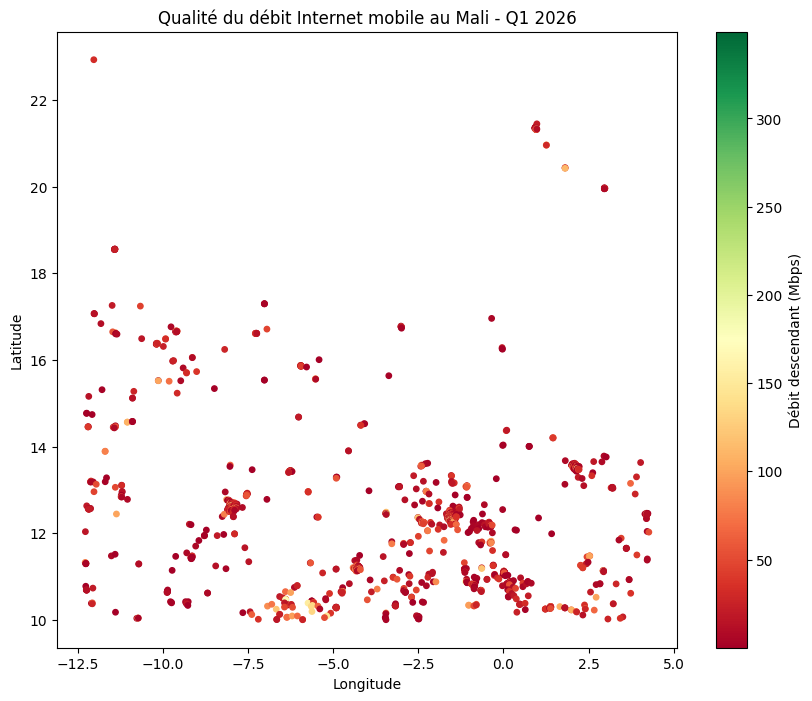

In [ ]:
plt.figure(figsize=(10, 8))
plt.scatter(mali["tile_x"], mali["tile_y"], c=mali["avg_d_kbps"] / 1000, cmap="RdYlGn", s=15)
plt.colorbar(label="Débit descendant (Mbps)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Qualité du débit Internet mobile au Mali - Q1 2026")
plt.show()

Conversion des tuiles en géométrie

In [ ]:
mali["geometry"] = gpd.GeoSeries.from_wkt(mali["tile"])
print(mali[["tile", "geometry"]].head())

                                                     tile  \
721784  POLYGON((-12.041015625 22.9331007469804, -12.0...   
726890  POLYGON((-11.4312744140625 18.5577399840853, -...   
726891  POLYGON((-11.436767578125 18.5525323663856, -1...   
726892  POLYGON((-11.4312744140625 18.5525323663856, -...   
726893  POLYGON((-11.42578125 18.5629474428883, -11.42...   

                                                 geometry  
721784  POLYGON ((-12.04102 22.9331, -12.03552 22.9331...  
726890  POLYGON ((-11.43127 18.55774, -11.42578 18.557...  
726891  POLYGON ((-11.43677 18.55253, -11.43127 18.552...  
726892  POLYGON ((-11.43127 18.55253, -11.42578 18.552...  
726893  POLYGON ((-11.42578 18.56295, -11.42029 18.562...  


In [ ]:
mali_gdf = gpd.GeoDataFrame(mali, geometry="geometry", crs="EPSG:4326")
print(mali_gdf.crs)
print(mali_gdf.geometry.geom_type.value_counts())

EPSG:4326
Polygon    1662
Name: count, dtype: int64


Délimitation des frontières du Mali

In [ ]:
monde = gpd.read_file("https://raw.githubusercontent.com/datasets/geo-countries/master/data/countries.geojson")
print(monde.columns.tolist())

['name', 'ISO3166-1-Alpha-3', 'ISO3166-1-Alpha-2', 'geometry']


In [ ]:
mali_frontiere = monde[monde["name"] == "Mali"].copy()
print(mali_frontiere)

    name ISO3166-1-Alpha-3 ISO3166-1-Alpha-2  \
97  Mali               MLI                ML   

                                             geometry  
97  POLYGON ((-12.26413 14.77494, -12.24679 14.767...  


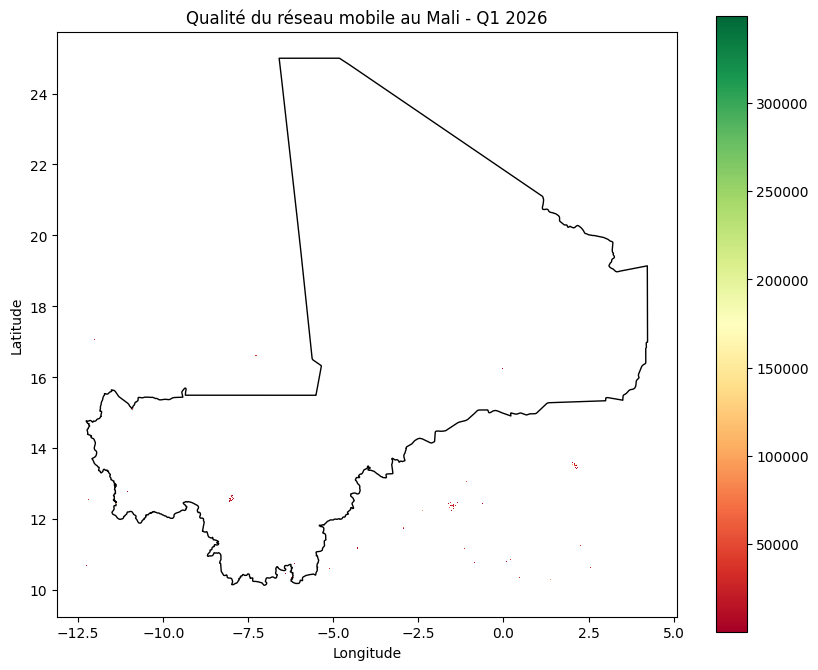

In [ ]:
mali_frontiere.plot(facecolor="none", edgecolor="black", figsize=(10, 8))
ax = plt.gca()
mali_gdf.plot(ax=ax, column="avg_d_kbps", cmap="RdYlGn", markersize=5, legend=True)
plt.title("Qualité du réseau mobile au Mali - Q1 2026")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

Sélection des tuiles situées au Mali

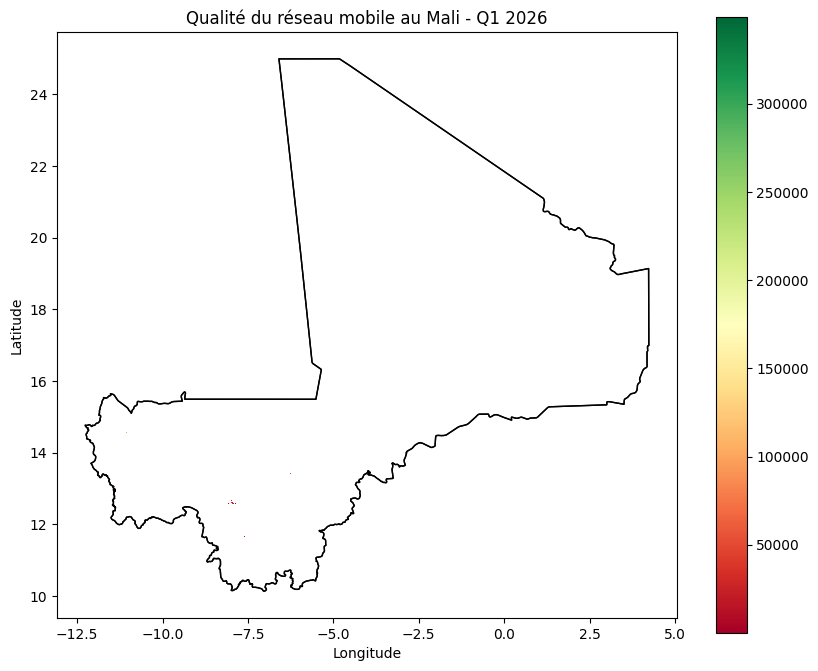

In [ ]:
mali_gdf = mali_gdf[mali_gdf.geometry.intersects(mali_frontiere.geometry.iloc[0])].copy()
mali_frontiere.plot(facecolor="none", edgecolor="black", figsize=(10, 8))
ax = plt.gca()
mali_gdf.plot(ax=ax, column="avg_d_kbps", cmap="RdYlGn", legend=True, edgecolor="none")
mali_frontiere.boundary.plot(ax=ax, color="black", linewidth=1)
plt.title("Qualité du réseau mobile au Mali - Q1 2026")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

Analyse des performances du réseau mobile

Débit descendant

In [ ]:
mali_gdf["debit_mbps"] = mali_gdf["avg_d_kbps"] / 1000

In [ ]:
print(len(mali_gdf))

print(mali_gdf.geometry.geom_type.value_counts())

print(mali_gdf["avg_d_kbps"].describe())

333
Polygon    333
Name: count, dtype: int64
count       333.000000
mean      31155.660661
std       36580.083567
min          10.000000
25%        8529.000000
50%       21465.000000
75%       43854.000000
max      349157.000000
Name: avg_d_kbps, dtype: float64


Cartographie du débit descendant

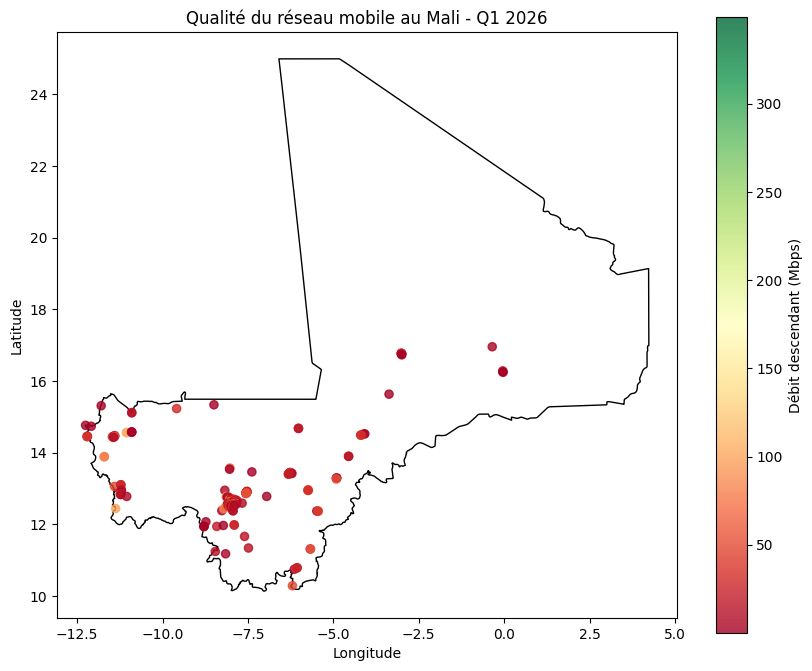

In [ ]:
mali_frontiere.plot(facecolor="none", edgecolor="black", figsize=(10, 8))
ax = plt.gca()
sc = ax.scatter(
mali_gdf["tile_x"],
mali_gdf["tile_y"],
c=mali_gdf["avg_d_kbps"] / 1000,
cmap="RdYlGn",
s=35,
alpha=0.8
)
plt.colorbar(sc, ax=ax, label="Débit descendant (Mbps)")
plt.title("Qualité du réseau mobile au Mali - Q1 2026")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

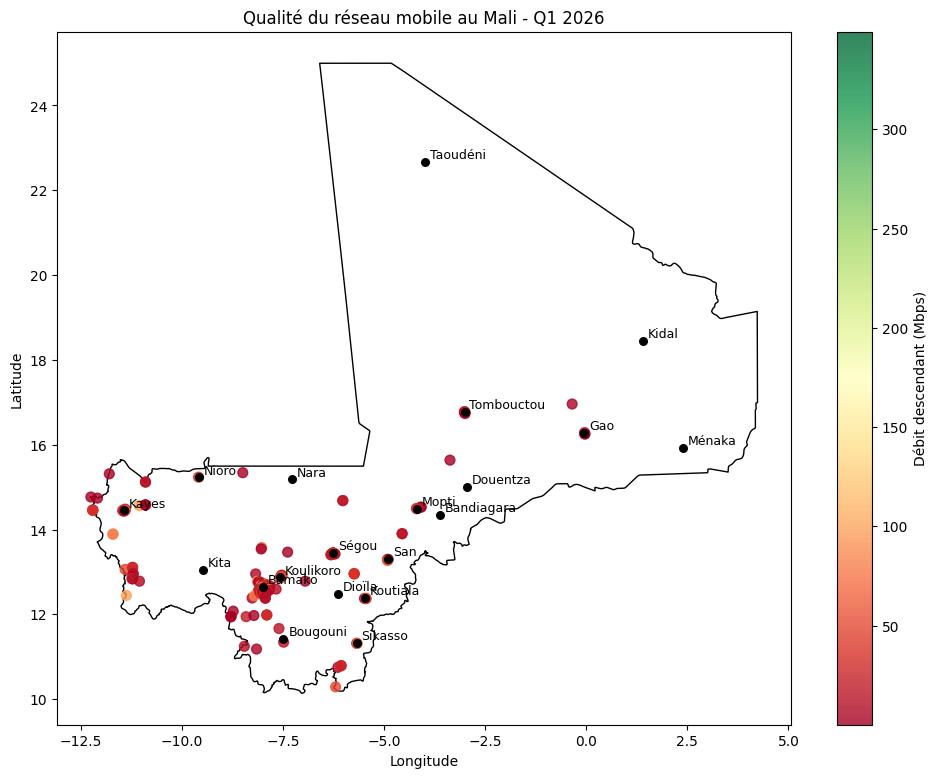

In [ ]:
mali_frontiere.plot(facecolor="none", edgecolor="black", figsize=(12, 9))
ax = plt.gca()
sc = ax.scatter(
mali_gdf["tile_x"],
mali_gdf["tile_y"],
c=mali_gdf["avg_d_kbps"] / 1000,
cmap="RdYlGn",
s=50,
alpha=0.8
)
villes = {
"Kayes": (-11.44, 14.45),
"Nioro": (-9.59, 15.23),
"Kita": (-9.49, 13.04),
"Koulikoro": (-7.58, 12.87),
"Dioïla": (-6.14, 12.48),
"Sikasso": (-5.68, 11.32),
"Bougouni": (-7.49, 11.42),
"Koutiala": (-5.47, 12.39),
"Ségou": (-6.26, 13.44),
"San": (-4.90, 13.30),
"Mopti": (-4.18, 14.49),
"Bandiagara": (-3.61, 14.35),
"Tombouctou": (-3.01, 16.78),
"Taoudéni": (-3.98, 22.67),
"Gao": (-0.05, 16.27),
"Ménaka": (2.40, 15.92),
"Kidal": (1.41, 18.45),
"Douentza": (-2.96, 15.00),
"Nara": (-7.28, 15.18),
"Bamako": (-7.99, 12.65)
}
for ville, (lon, lat) in villes.items():
 ax.scatter(lon, lat, color="black", s=30, zorder=5)
 ax.text(lon + 0.12, lat + 0.08, ville, fontsize=9, zorder=6)
plt.colorbar(sc, ax=ax, label="Débit descendant (Mbps)")
plt.title("Qualité du réseau mobile au Mali - Q1 2026")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

In [ ]:
from scipy.spatial import cKDTree

DISTANCE_MAX_DEG = 0.5  # ~55 km à cette latitude, ajuste si besoin

villes_df = pd.DataFrame(
    [(ville, lon, lat) for ville, (lon, lat) in villes.items()],
    columns=["ville", "longitude", "latitude"]
)
tree = cKDTree(villes_df[["longitude", "latitude"]].values)
distances, indices_villes = tree.query(mali_gdf[["tile_x", "tile_y"]].values)

mali_gdf["ville"] = villes_df.iloc[indices_villes]["ville"].values
mali_gdf["distance_ville_deg"] = distances

mali_gdf_proche = mali_gdf[mali_gdf["distance_ville_deg"] <= DISTANCE_MAX_DEG].copy()
print("Tuiles conservées :", len(mali_gdf_proche), "/", len(mali_gdf))

Tuiles conservées : 281 / 333


In [ ]:
print("Nombre de points au Mali :", len(mali_gdf))

print("Nombre de points à Bamako :", len(bamako))

print("Débit moyen à Bamako :", bamako["avg_d_kbps"].mean() / 1000, "Mbps")

print("Latence moyenne à Bamako :", bamako["avg_lat_ms"].mean(), "ms")

Nombre de points au Mali : 333
Nombre de points à Bamako : 209
Débit moyen à Bamako : 34.69818660287081 Mbps
Latence moyenne à Bamako : 32.07177033492823 ms


In [ ]:
print("Avant filtrage spatial :", len(mali))

print("Après filtrage spatial :", len(mali_gdf))

print("Tuiles retirées :", len(mali) - len(mali_gdf))

Avant filtrage spatial : 1662
Après filtrage spatial : 333
Tuiles retirées : 1329


In [ ]:
points_mali = gpd.GeoDataFrame(
mali,
geometry=gpd.points_from_xy(mali["tile_x"], mali["tile_y"]),
crs="EPSG:4326"
)

points_mali_dans_frontiere = points_mali[
points_mali.geometry.within(mali_frontiere.geometry.iloc[0])
].copy()

print("Points dont le centre est au Mali :", len(points_mali_dans_frontiere))

Points dont le centre est au Mali : 333


In [ ]:
reste_mali = mali_gdf[~mali_gdf.index.isin(bamako.index)]

print("Nombre de points - reste du Mali :", len(reste_mali))

print("Débit moyen - reste du Mali :", reste_mali["avg_d_kbps"].mean() / 1000, "Mbps")

print("Latence moyenne - reste du Mali :", reste_mali["avg_lat_ms"].mean(), "ms")

Nombre de points - reste du Mali : 124
Débit moyen - reste du Mali : 25.184790322580643 Mbps
Latence moyenne - reste du Mali : 95.62903225806451 ms


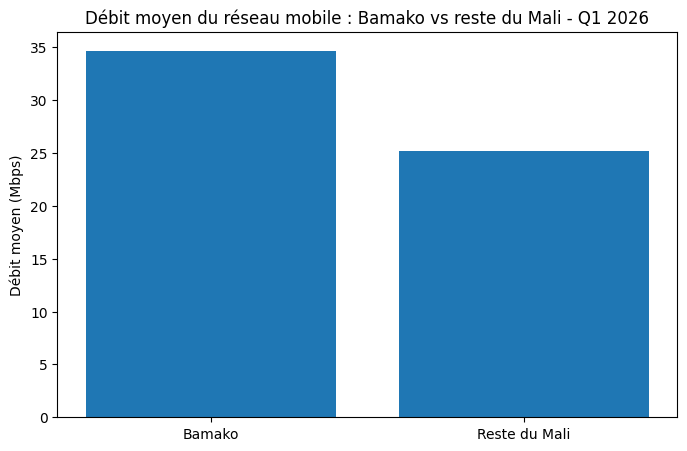

In [ ]:
zones = ["Bamako", "Reste du Mali"]

debits = [
bamako["avg_d_kbps"].mean() / 1000,
reste_mali["avg_d_kbps"].mean() / 1000
]

plt.figure(figsize=(8, 5))

plt.bar(zones, debits)

plt.ylabel("Débit moyen (Mbps)")

plt.title("Débit moyen du réseau mobile : Bamako vs reste du Mali - Q1 2026")

plt.show()

Analyse de la latence

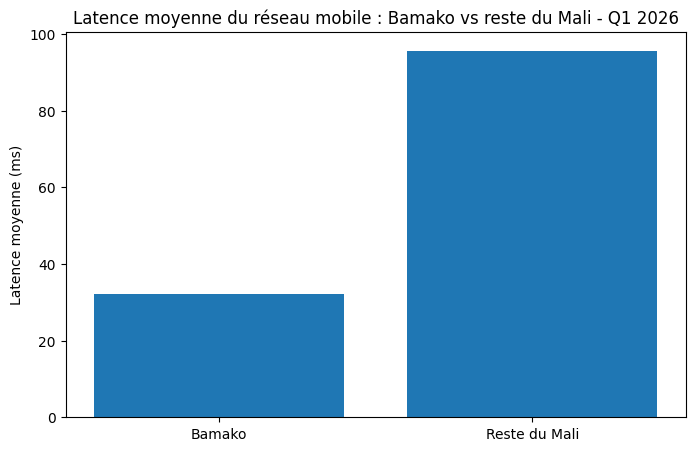

In [ ]:
zones = ["Bamako", "Reste du Mali"]

latences = [
bamako["avg_lat_ms"].mean(),
reste_mali["avg_lat_ms"].mean()
]

plt.figure(figsize=(8, 5))

plt.bar(zones, latences)

plt.ylabel("Latence moyenne (ms)")

plt.title("Latence moyenne du réseau mobile : Bamako vs reste du Mali - Q1 2026")

plt.show()

Classification de la qualité du débit descendant

In [ ]:
mali_gdf["qualite_download"] = pd.cut(
mali_gdf["avg_d_kbps"] / 1000,
bins=[0, 5, 10, 25, float("inf")],
labels=["Très faible", "Faible", "Moyenne", "Bonne"]
)

print(mali_gdf["qualite_download"].value_counts())

qualite_download
Bonne          148
Moyenne         89
Très faible     64
Faible          32
Name: count, dtype: int64


Cartographie de la latence

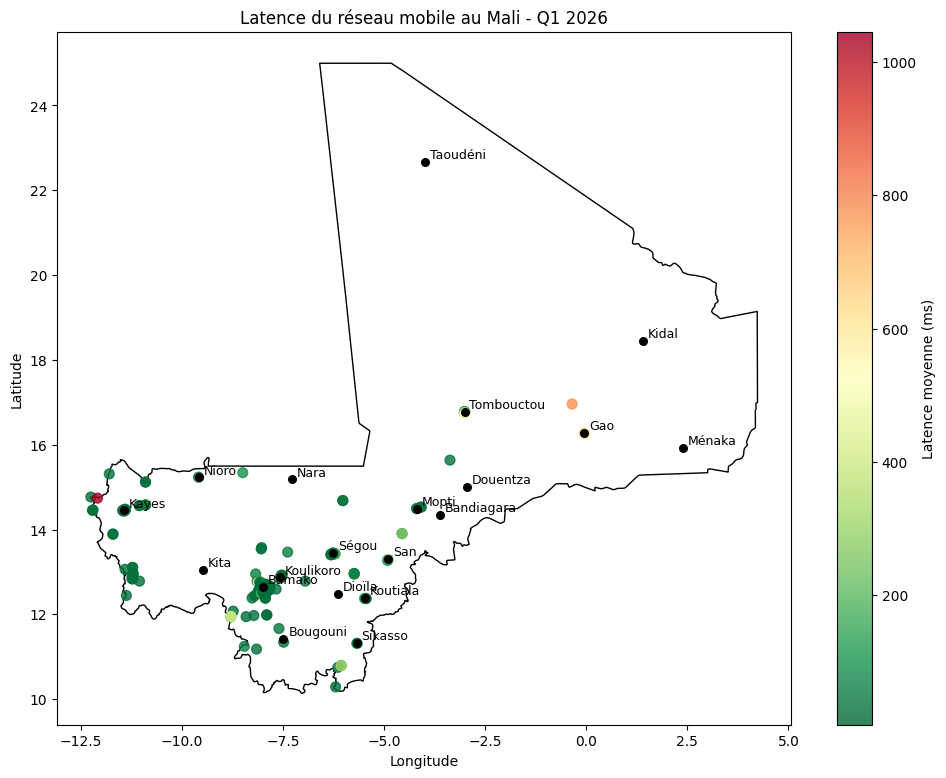

In [ ]:
mali_frontiere.plot(facecolor="none", edgecolor="black", figsize=(12, 9))
ax = plt.gca()
sc = ax.scatter(
mali_gdf["tile_x"],
mali_gdf["tile_y"],
c=mali_gdf["avg_lat_ms"],
cmap="RdYlGn_r",
s=50,
alpha=0.8
)
for ville, (lon, lat) in villes.items():
 ax.scatter(lon, lat, color="black", s=30, zorder=5)
 ax.text(lon + 0.12, lat + 0.08, ville, fontsize=9, zorder=6)
plt.colorbar(sc, ax=ax, label="Latence moyenne (ms)")
plt.title("Latence du réseau mobile au Mali - Q1 2026")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

In [ ]:
print(mali_gdf["avg_lat_ms"].describe())
print("Latence médiane :", mali_gdf["avg_lat_ms"].median(), "ms")
print("Latence > 200 ms :", (mali_gdf["avg_lat_ms"] > 200).sum())
print("Latence > 500 ms :", (mali_gdf["avg_lat_ms"] > 500).sum())

count     333.000000
mean       55.738739
std       120.207780
min         6.000000
25%        17.000000
50%        21.000000
75%        31.000000
max      1045.000000
Name: avg_lat_ms, dtype: float64
Latence médiane : 21.0 ms
Latence > 200 ms : 22
Latence > 500 ms : 8


In [ ]:
correlation = mali_gdf_proche[["debit_mbps", "avg_lat_ms"]].corr().iloc[0, 1]
print("Corrélation débit / latence :", round(correlation, 3))
from scipy.stats import pearsonr

r, p_value = pearsonr(mali_gdf_proche["debit_mbps"], mali_gdf_proche["avg_lat_ms"])
print(f"Coefficient de Pearson : {r:.3f}")
print(f"p-value : {p_value:.4f}")

Corrélation débit / latence : -0.192
Coefficient de Pearson : -0.192
p-value : 0.0012


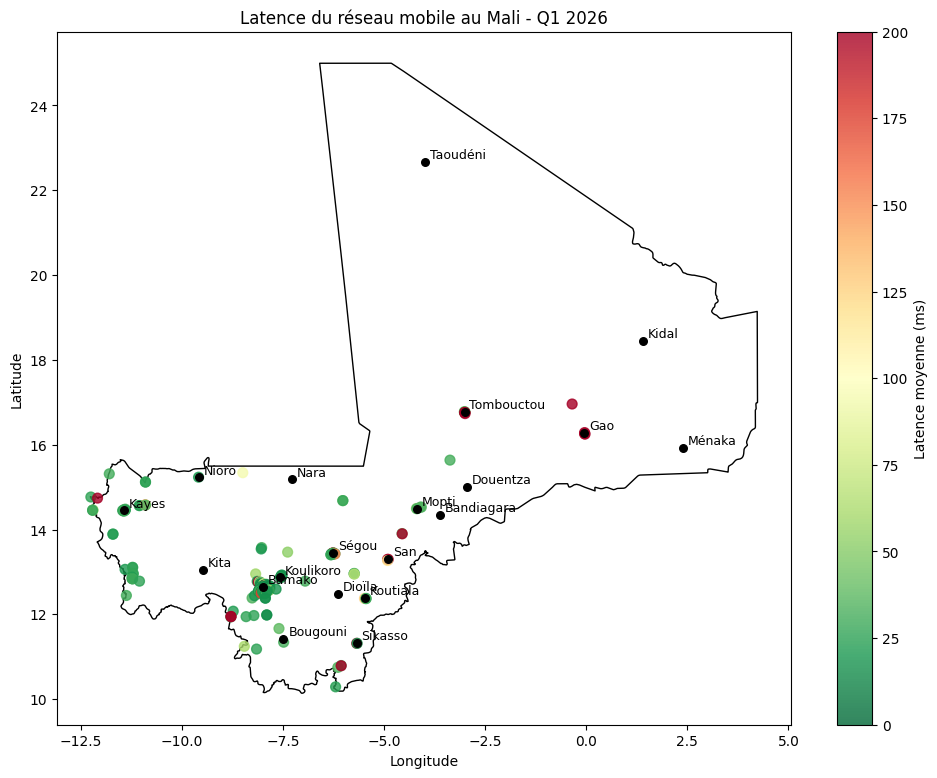

In [ ]:
mali_frontiere.plot(facecolor="none", edgecolor="black", figsize=(12, 9))
ax = plt.gca()
sc = ax.scatter(
mali_gdf["tile_x"],
mali_gdf["tile_y"],
c=mali_gdf["avg_lat_ms"],
cmap="RdYlGn_r",
s=50,
alpha=0.8,
vmin=0,
vmax=200
)
for ville, (lon, lat) in villes.items():
 ax.scatter(lon, lat, color="black", s=30, zorder=5)
 ax.text(lon + 0.12, lat + 0.08, ville, fontsize=9, zorder=6)
plt.colorbar(sc, ax=ax, label="Latence moyenne (ms)")
plt.title("Latence du réseau mobile au Mali - Q1 2026")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

In [ ]:
mali_gdf["qualite_latence"] = pd.cut(
mali_gdf["avg_lat_ms"],
bins=[0, 20, 50, 100, float("inf")],
labels=["Très bonne", "Bonne", "Moyenne", "Élevée"]
)
print(mali_gdf["qualite_latence"].value_counts())

qualite_latence
Très bonne    163
Bonne         122
Élevée         30
Moyenne        18
Name: count, dtype: int64


Classification de la latence

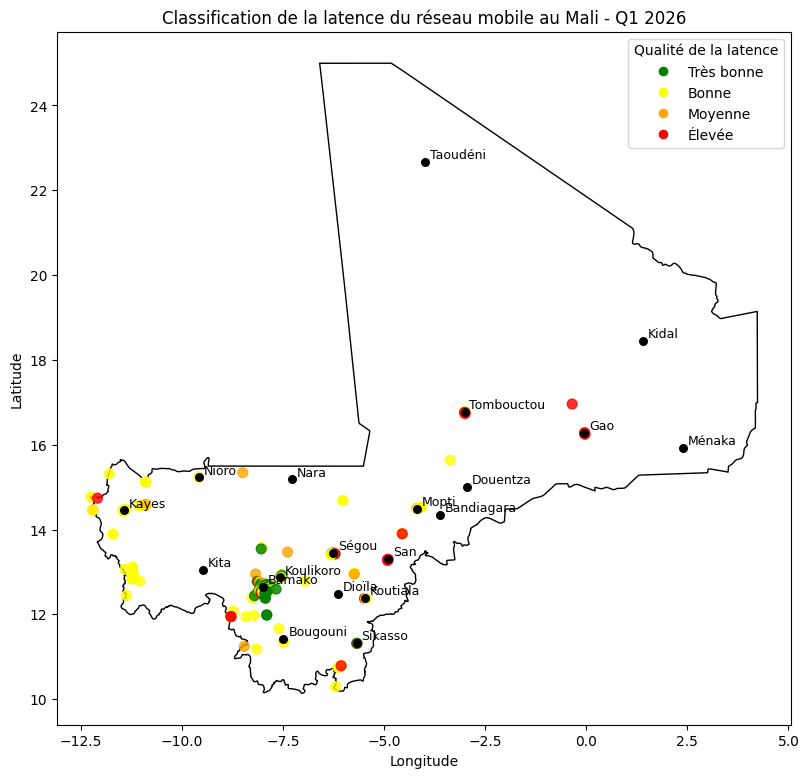

In [ ]:
from matplotlib.colors import ListedColormap
from matplotlib.lines import Line2D

mali_frontiere.plot(facecolor="none", edgecolor="black", figsize=(12, 9))

ax = plt.gca()

codes = mali_gdf["qualite_latence"].cat.codes

cmap = ListedColormap(["green", "yellow", "orange", "red"])

ax.scatter(
mali_gdf["tile_x"],
mali_gdf["tile_y"],
c=codes,
cmap=cmap,
vmin=0,
vmax=3,
s=50,
alpha=0.8,
zorder=3
)

for ville, (lon, lat) in villes.items():
 ax.scatter(lon, lat, color="black", s=30, zorder=5)
 ax.text(lon + 0.12, lat + 0.08, ville, fontsize=9, zorder=6)

legende = [
Line2D([0], [0], marker="o", color="w", markerfacecolor="green", markersize=8, label="Très bonne"),
Line2D([0], [0], marker="o", color="w", markerfacecolor="yellow", markersize=8, label="Bonne"),
Line2D([0], [0], marker="o", color="w", markerfacecolor="orange", markersize=8, label="Moyenne"),
Line2D([0], [0], marker="o", color="w", markerfacecolor="red", markersize=8, label="Élevée")
]

ax.legend(handles=legende, title="Qualité de la latence")

plt.title("Classification de la latence du réseau mobile au Mali - Q1 2026")

plt.xlabel("Longitude")

plt.ylabel("Latitude")

plt.show()

In [ ]:
print(mali_gdf[["tests", "devices"]].describe())
print("Total des tests :", mali_gdf["tests"].sum())
print("Total des appareils :", mali_gdf["devices"].sum())

            tests     devices
count  333.000000  333.000000
mean     2.831832    1.186186
std      4.398310    0.587153
min      1.000000    1.000000
25%      1.000000    1.000000
50%      1.000000    1.000000
75%      3.000000    1.000000
max     40.000000    7.000000
Total des tests : 943
Total des appareils : 395


Analyse du nombre de tests

In [ ]:
top_tests = mali_gdf.sort_values("tests", ascending=False)

print(
top_tests[
["tile_x", "tile_y", "avg_d_kbps", "avg_lat_ms", "tests", "devices"]
].head(10)
)

         tile_x   tile_y  avg_d_kbps  avg_lat_ms  tests  devices
728476  -3.0020  16.7598       14563         284     40        2
728742  -7.8964  12.5680       52059          16     37        2
727972 -11.4395  14.4480       44586          26     30        1
728753  -7.5394  12.9055       34008          19     23        1
728640  -8.0283  12.6323       24425          86     22        7
728607  -7.9898  12.6698       43962          18     20        2
728731  -7.8305  12.6752       10673          18     16        1
728755  -7.5339  12.9162       20666          22     15        1
728646  -8.0173  12.6323       60704          18     13        3
728693  -7.9733  12.6055       93299          17     12        3


Analyse du nombre de dispositifs

In [ ]:
mali_gdf["fiabilite_mesure"] = pd.cut(
mali_gdf["tests"],
bins=[0, 2, 5, 10, float("inf")],
labels=["Faible", "Moyenne", "Bonne", "Très bonne"]
)

print(mali_gdf["fiabilite_mesure"].value_counts())

fiabilite_mesure
Faible        241
Moyenne        52
Bonne          28
Très bonne     12
Name: count, dtype: int64


Identification des zones à faible débit

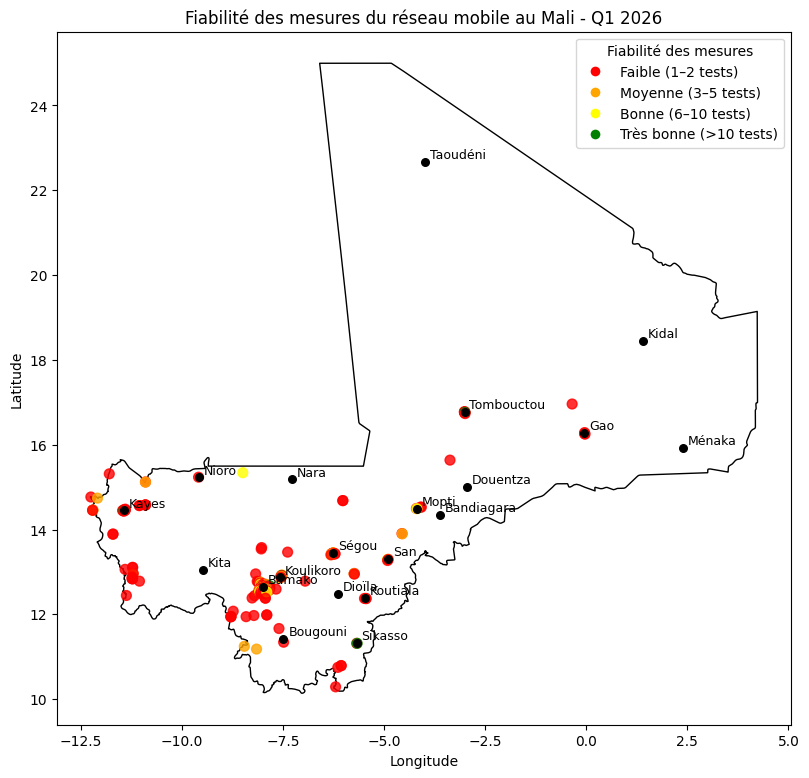

In [ ]:
from matplotlib.colors import ListedColormap
from matplotlib.lines import Line2D

mali_frontiere.plot(facecolor="none", edgecolor="black", figsize=(12, 9))

ax = plt.gca()

codes = mali_gdf["fiabilite_mesure"].cat.codes

cmap = ListedColormap(["red", "orange", "yellow", "green"])

ax.scatter(
mali_gdf["tile_x"],
mali_gdf["tile_y"],
c=codes,
cmap=cmap,
vmin=0,
vmax=3,
s=50,
alpha=0.8,
zorder=3
)

for ville, (lon, lat) in villes.items():
 ax.scatter(lon, lat, color="black", s=30, zorder=5)
 ax.text(lon + 0.12, lat + 0.08, ville, fontsize=9, zorder=6)

legende = [
Line2D([0], [0], marker="o", color="w", markerfacecolor="red", markersize=8, label="Faible (1–2 tests)"),
Line2D([0], [0], marker="o", color="w", markerfacecolor="orange", markersize=8, label="Moyenne (3–5 tests)"),
Line2D([0], [0], marker="o", color="w", markerfacecolor="yellow", markersize=8, label="Bonne (6–10 tests)"),
Line2D([0], [0], marker="o", color="w", markerfacecolor="green", markersize=8, label="Très bonne (>10 tests)")
]

ax.legend(handles=legende, title="Fiabilité des mesures")

plt.title("Fiabilité des mesures du réseau mobile au Mali - Q1 2026")

plt.xlabel("Longitude")

plt.ylabel("Latitude")

plt.show()

In [ ]:
mali_gdf.groupby("fiabilite_mesure", observed=True)["avg_d_kbps"].mean() / 1000

fiabilite_mesure
Faible        30.158290
Moyenne       31.572981
Bonne         35.652036
Très bonne    38.886250
Name: avg_d_kbps, dtype: float64

In [ ]:
mali_gdf[(mali_gdf["avg_d_kbps"] / 1000 < 10) & (mali_gdf["tests"] >= 3)][["tile_x", "tile_y", "avg_d_kbps", "avg_lat_ms", "tests"]]

,tile_x,tile_y,avg_d_kbps,avg_lat_ms,tests
727964,-12.0877,14.7404,512,1045,3
728506,-8.4952,15.3398,740,94,6
728544,-11.2088,12.9484,295,33,3
728592,-8.0063,12.6752,4430,15,3
728633,-8.0557,12.6109,9752,17,4
728657,-8.0667,12.5787,8531,19,5
728658,-8.0612,12.5841,8963,22,3
728672,-8.0228,12.5787,4680,22,3
728685,-7.9898,12.6109,8024,42,4
728698,-7.9184,12.6216,9553,19,4


In [ ]:
mali_faible_fiable = mali_gdf[(mali_gdf["avg_d_kbps"] / 1000 < 10) & (mali_gdf["tests"] >= 3)]

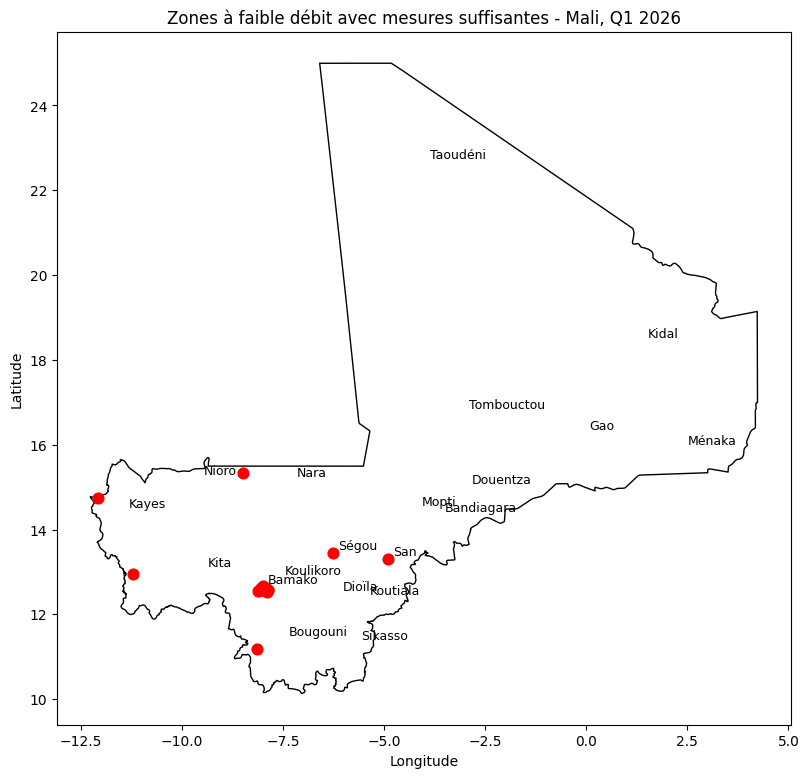

In [ ]:
mali_frontiere.plot(facecolor="none", edgecolor="black", figsize=(12, 9))
ax = plt.gca()

ax.scatter(
mali_faible_fiable["tile_x"],
mali_faible_fiable["tile_y"],
color="red",
s=60,
zorder=5
)

for ville, (lon, lat) in villes.items():
 ax.text(lon + 0.12, lat + 0.08, ville, fontsize=9)

plt.title("Zones à faible débit avec mesures suffisantes - Mali, Q1 2026")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

Identification des zones présentant des problèmes combinés

In [ ]:
mali_problemes = mali_gdf_proche[
    (mali_gdf_proche["debit_mbps"] < 10) &
    (mali_gdf_proche["avg_lat_ms"] > 100) &
    (mali_gdf_proche["tests"] >= 3)
]
print("Nombre de zones problématiques :", len(mali_problemes))
mali_problemes[["tile_x", "tile_y", "avg_d_kbps", "avg_lat_ms", "tests"]]

Nombre de zones problématiques : 2


,tile_x,tile_y,avg_d_kbps,avg_lat_ms,tests
728770,-6.2595,13.4511,4450,423,4
728851,-4.9136,13.2961,4443,427,6


Cartographie des zones prioritaires

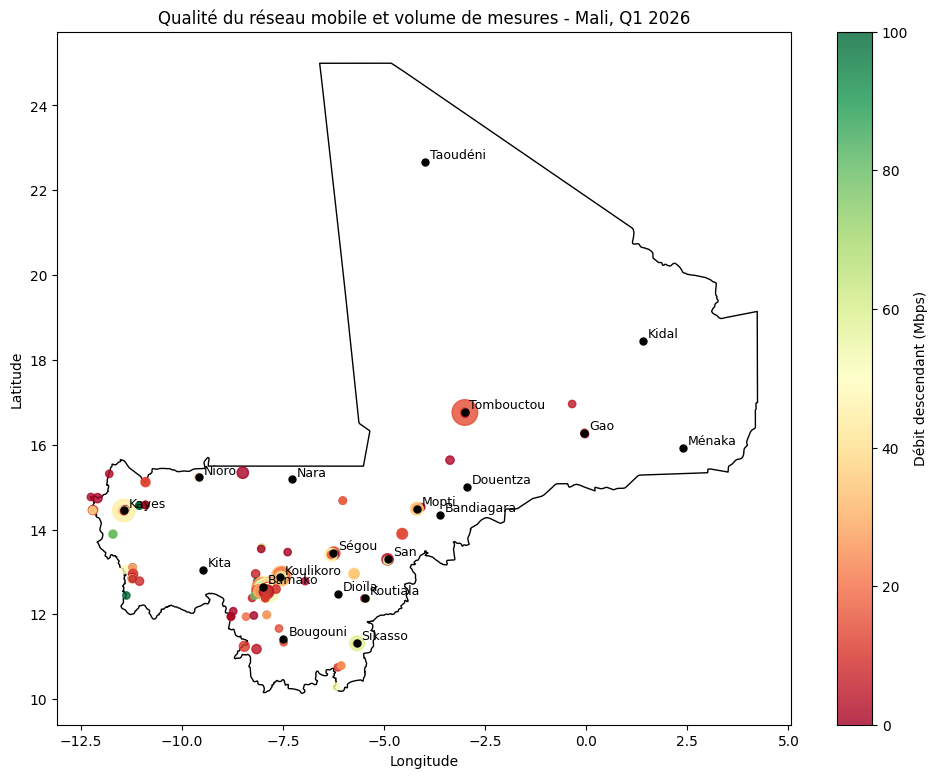

In [ ]:
mali_frontiere.plot(facecolor="none", edgecolor="black", figsize=(12, 9))
ax = plt.gca()

sc = ax.scatter(
mali_gdf["tile_x"],
mali_gdf["tile_y"],
c=mali_gdf["avg_d_kbps"] / 1000,
cmap="RdYlGn",
vmin=0,
vmax=100,
s=20 + mali_gdf["tests"] * 8,
alpha=0.8,
zorder=3
)

for ville, (lon, lat) in villes.items():
 ax.scatter(lon, lat, color="black", s=25, zorder=5)
 ax.text(lon + 0.12, lat + 0.08, ville, fontsize=9, zorder=6)

plt.colorbar(sc, ax=ax, label="Débit descendant (Mbps)")
plt.title("Qualité du réseau mobile et volume de mesures - Mali, Q1 2026")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

In [ ]:
resume = {
"Nombre de zones analysées": len(mali_gdf),
"Débit moyen (Mbps)": mali_gdf["debit_mbps"].mean(),
"Débit médian (Mbps)": mali_gdf["debit_mbps"].median(),
"Latence moyenne (ms)": mali_gdf["avg_lat_ms"].mean(),
"Latence médiane (ms)": mali_gdf["avg_lat_ms"].median(),
"Nombre total de tests": mali_gdf["tests"].sum(),
"Nombre total de dispositifs": mali_gdf["devices"].sum(),
"Zones < 10 Mbps": (mali_gdf["debit_mbps"] < 10).sum(),
"Zones < 10 Mbps avec ≥ 3 tests": len(mali_faible_fiable),
"Zones < 10 Mbps + latence > 100 ms + ≥ 3 tests": len(mali_problemes)
}

resume_df = pd.DataFrame(
list(resume.items()),
columns=["Indicateur", "Valeur"]
)

resume_df


,Indicateur,Valeur
0,Nombre de zones analysées,333.000000
1,Débit moyen (Mbps),31.155661
2,Débit médian (Mbps),21.465000
3,Latence moyenne (ms),55.738739
4,Latence médiane (ms),21.000000
5,Nombre total de tests,943.000000
6,Nombre total de dispositifs,395.000000
7,Zones < 10 Mbps,96.000000
8,Zones < 10 Mbps avec ≥ 3 tests,17.000000
9,Zones < 10 Mbps + latence > 100 ms + ≥ 3 tests,2.000000


In [ ]:
(mali_gdf["debit_mbps"] < 10).mean() * 100

np.float64(28.82882882882883)

In [ ]:
len(mali_faible_fiable) / len(mali_gdf) * 100

5.105105105105105

In [ ]:
len(mali_problemes) / len(mali_gdf) * 100

0.6006006006006006

AGREGATION

Calcul des indicateurs par ville

In [ ]:
def stats_ville(groupe):
    poids = groupe["tests"]
    return pd.Series({
        "debit_moyen_Mbps": np.average(groupe["debit_mbps"], weights=poids),
        "debit_median_Mbps": groupe["debit_mbps"].median(),
        "latence_moyenne_ms": np.average(groupe["avg_lat_ms"], weights=poids),
        "latence_mediane_ms": groupe["avg_lat_ms"].median(),
        "nombre_tests": poids.sum(),
        "nombre_zones": len(groupe)
    })

resume_villes = mali_gdf_proche.groupby("ville").apply(stats_ville).reset_index()
resume_villes = resume_villes.sort_values("debit_moyen_Mbps", ascending=False)
resume_villes

,ville,debit_moyen_Mbps,debit_median_Mbps,latence_moyenne_ms,latence_mediane_ms,nombre_tests,nombre_zones
9,Sikasso,54.283077,30.9635,33.000000,110.0,13.0,2.0
3,Kayes,46.101175,51.2745,26.100000,25.5,40.0,10.0
0,Bamako,37.757034,23.8550,30.467742,18.0,620.0,214.0
5,Koutiala,31.704000,37.9480,60.000000,30.0,3.0,3.0
7,Nioro,30.908000,30.9080,21.000000,21.0,1.0,1.0
4,Koulikoro,30.448585,26.1730,20.230769,19.0,65.0,13.0
10,Ségou,28.147595,25.8040,81.476190,28.0,42.0,18.0
6,Mopti,27.376833,14.8145,35.416667,33.5,12.0,4.0
11,Tombouctou,16.221128,7.2780,269.106383,43.5,47.0,8.0
8,San,15.414778,4.4430,343.777778,296.0,9.0,3.0


In [ ]:
resume_villes["fiabilite"] = pd.cut(resume_villes["nombre_tests"], bins=[0, 2, 10, 30, float("inf")], labels=["Faible", "Moyenne", "Bonne", "Très bonne"])
resume_villes

,ville,debit_moyen_Mbps,debit_median_Mbps,latence_moyenne_ms,latence_mediane_ms,nombre_tests,nombre_zones,fiabilite
9,Sikasso,54.283077,30.9635,33.000000,110.0,13.0,2.0,Bonne
3,Kayes,46.101175,51.2745,26.100000,25.5,40.0,10.0,Très bonne
0,Bamako,37.757034,23.8550,30.467742,18.0,620.0,214.0,Très bonne
5,Koutiala,31.704000,37.9480,60.000000,30.0,3.0,3.0,Moyenne
7,Nioro,30.908000,30.9080,21.000000,21.0,1.0,1.0,Faible
4,Koulikoro,30.448585,26.1730,20.230769,19.0,65.0,13.0,Très bonne
10,Ségou,28.147595,25.8040,81.476190,28.0,42.0,18.0,Très bonne
6,Mopti,27.376833,14.8145,35.416667,33.5,12.0,4.0,Bonne
11,Tombouctou,16.221128,7.2780,269.106383,43.5,47.0,8.0,Très bonne
8,San,15.414778,4.4430,343.777778,296.0,9.0,3.0,Moyenne


Sélection des villes suffisamment représentées

In [ ]:
villes_fiables = resume_villes[resume_villes["nombre_tests"] >= 10].copy()
villes_fiables = villes_fiables.sort_values("debit_moyen_Mbps", ascending=False)
villes_fiables

,ville,debit_moyen_Mbps,debit_median_Mbps,latence_moyenne_ms,latence_mediane_ms,nombre_tests,nombre_zones,fiabilite
9,Sikasso,54.283077,30.9635,33.000000,110.0,13.0,2.0,Bonne
3,Kayes,46.101175,51.2745,26.100000,25.5,40.0,10.0,Très bonne
0,Bamako,37.757034,23.8550,30.467742,18.0,620.0,214.0,Très bonne
4,Koulikoro,30.448585,26.1730,20.230769,19.0,65.0,13.0,Très bonne
10,Ségou,28.147595,25.8040,81.476190,28.0,42.0,18.0,Très bonne
6,Mopti,27.376833,14.8145,35.416667,33.5,12.0,4.0,Bonne
11,Tombouctou,16.221128,7.2780,269.106383,43.5,47.0,8.0,Très bonne


In [ ]:
villes_latence_elevee = villes_fiables[villes_fiables["latence_moyenne_ms"] > 100]
villes_latence_elevee

,ville,debit_moyen_Mbps,debit_median_Mbps,latence_moyenne_ms,latence_mediane_ms,nombre_tests,nombre_zones,fiabilite
11,Tombouctou,16.221128,7.278,269.106383,43.5,47.0,8.0,Très bonne


In [ ]:
villes_prioritaires = villes_fiables[(villes_fiables["debit_moyen_Mbps"] < 20) & (villes_fiables["latence_moyenne_ms"] > 100)]
villes_prioritaires

,ville,debit_moyen_Mbps,debit_median_Mbps,latence_moyenne_ms,latence_mediane_ms,nombre_tests,nombre_zones,fiabilite
11,Tombouctou,16.221128,7.278,269.106383,43.5,47.0,8.0,Très bonne


Comparaison du débit moyen par ville

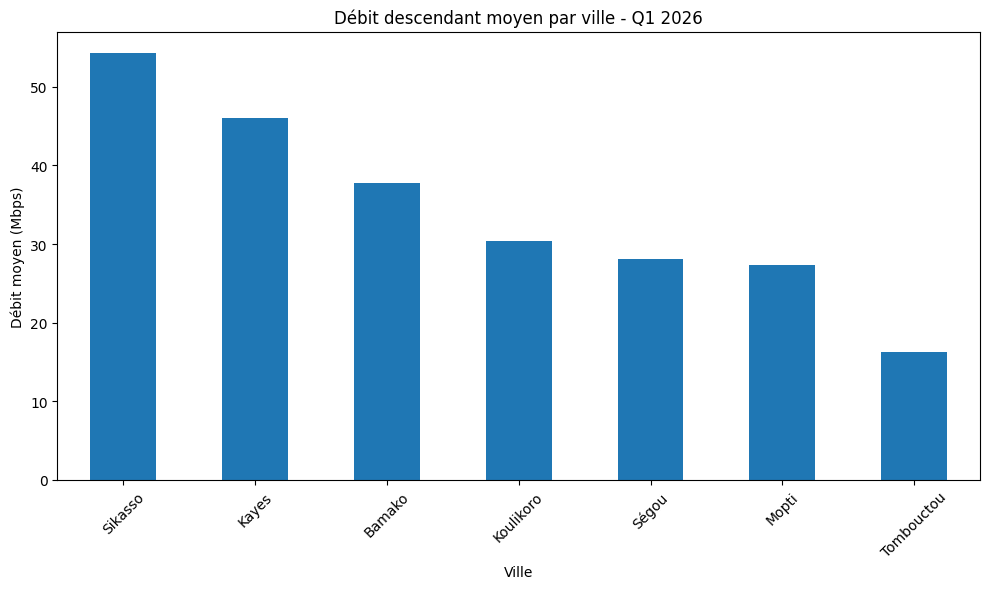

In [ ]:
villes_fiables.plot(x="ville", y="debit_moyen_Mbps", kind="bar", figsize=(10,6), legend=False)
plt.title("Débit descendant moyen par ville - Q1 2026")
plt.xlabel("Ville")
plt.ylabel("Débit moyen (Mbps)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Comparaison de la latence moyenne par ville

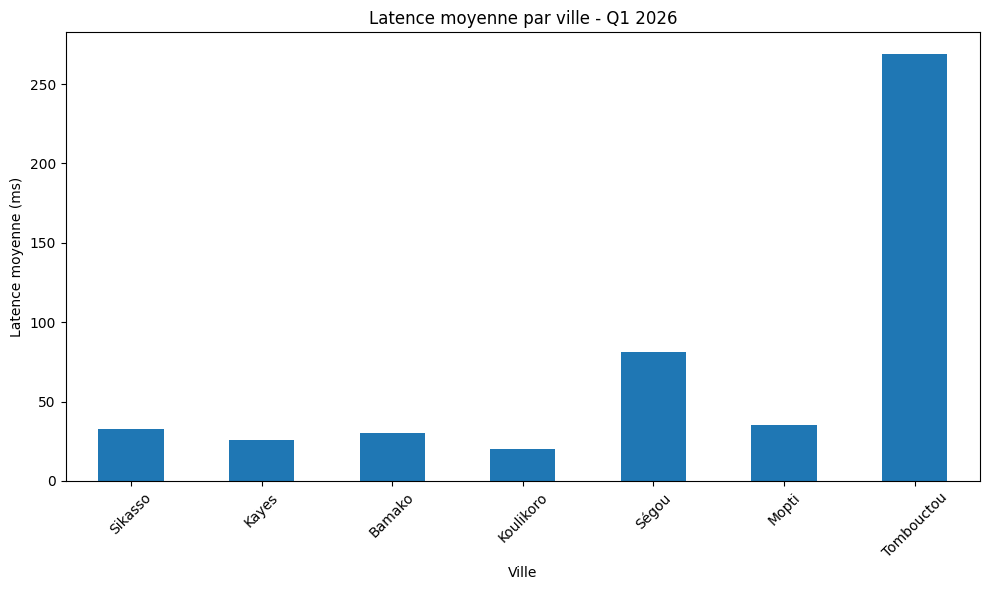

In [ ]:
villes_fiables.plot(x="ville", y="latence_moyenne_ms", kind="bar", figsize=(10,6), legend=False)
plt.title("Latence moyenne par ville - Q1 2026")
plt.xlabel("Ville")
plt.ylabel("Latence moyenne (ms)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Identification des villes prioritaires

Synthèse des performances par ville

In [ ]:
tableau_final = villes_fiables[["ville", "debit_moyen_Mbps", "debit_median_Mbps", "latence_moyenne_ms", "latence_mediane_ms", "nombre_tests", "nombre_zones"]].copy()
tableau_final.round(2)

,ville,debit_moyen_Mbps,debit_median_Mbps,latence_moyenne_ms,latence_mediane_ms,nombre_tests,nombre_zones
9,Sikasso,54.28,30.96,33.00,110.0,13.0,2.0
3,Kayes,46.10,51.27,26.10,25.5,40.0,10.0
0,Bamako,37.76,23.86,30.47,18.0,620.0,214.0
4,Koulikoro,30.45,26.17,20.23,19.0,65.0,13.0
10,Ségou,28.15,25.80,81.48,28.0,42.0,18.0
6,Mopti,27.38,14.81,35.42,33.5,12.0,4.0
11,Tombouctou,16.22,7.28,269.11,43.5,47.0,8.0


In [ ]:
conditions = [
    (tableau_final["debit_moyen_Mbps"] >= 25) & (tableau_final["latence_moyenne_ms"] < 50),
    (tableau_final["debit_moyen_Mbps"] >= 15) & (tableau_final["latence_moyenne_ms"] < 100),
]
choix = ["Bonne performance", "À surveiller"]

tableau_final["categorie"] = np.select(conditions, choix, default="Prioritaire")
tableau_final[["ville", "debit_moyen_Mbps", "latence_moyenne_ms", "nombre_tests", "categorie"]]

,ville,debit_moyen_Mbps,latence_moyenne_ms,nombre_tests,categorie
9,Sikasso,54.283077,33.000000,13.0,Bonne performance
3,Kayes,46.101175,26.100000,40.0,Bonne performance
0,Bamako,37.757034,30.467742,620.0,Bonne performance
4,Koulikoro,30.448585,20.230769,65.0,Bonne performance
10,Ségou,28.147595,81.476190,42.0,À surveiller
6,Mopti,27.376833,35.416667,12.0,Bonne performance
11,Tombouctou,16.221128,269.106383,47.0,Prioritaire


In [ ]:
tableau_final["couleur"] = tableau_final["categorie"].map({"Bonne performance": "green", "À surveiller": "orange", "Prioritaire": "red"})
plt.figure(figsize=(10,7))

<Figure size 1000x700 with 0 Axes>

<Figure size 1000x700 with 0 Axes>

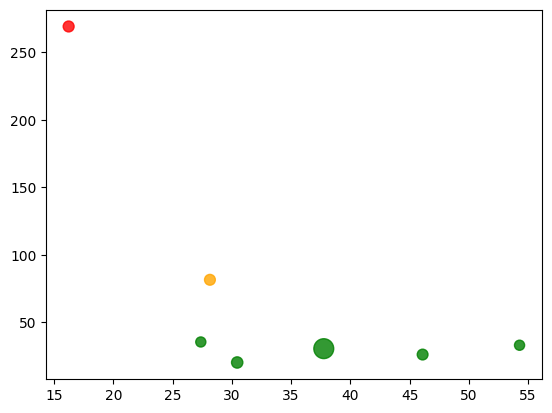

In [ ]:
plt.scatter(tableau_final["debit_moyen_Mbps"], tableau_final["latence_moyenne_ms"], c=tableau_final["couleur"], s=tableau_final["nombre_tests"]/4 + 50, alpha=0.8)

In [ ]:
for _, ligne in tableau_final.iterrows(): plt.text(ligne["debit_moyen_Mbps"] + 0.5, ligne["latence_moyenne_ms"] + 2, ligne["ville"], fontsize=9)